# My Capstone Project: Housing Rental Prices & Venues Data Analysis of London

## Introduction

This project deals with discussing the neighborhoods of London, capital of United Kingdom. It would specifically help individuals & investors planning to invest in real estate housing market, in terms of rental income and social venues attributes.

## Business Problem

London is the capital and largest city of England and the United Kingdom. London has a diverse range of people and cultures, and more than 300 languages are spoken in the region.Its estimated mid-2018 municipal population (corresponding to Greater London) was roughly 9 million, which made it the third-most populous city in Europe.London accounts for 13.4% of the U.K. population.Greater London Built-up Area is the third-most populous in Europe, after Moscow and Paris, with 9,787,426 inhabitants at the 2011 census. London has some of the highest real estate prices in the world.As of 2015 the residential property in London is worth $2.2 trillion – same value as that of Brazil's annual GDP.The city has the highest property prices of any European city according to the Office for National Statistics and the European Office of Statistics.On average the price per square metre in central London is €24,252. This is higher than the property prices in other G8 European capital cities

As from a local resident point of view we want to invest in such places were the housing rental values are low and the facilities(shops,restaurants,parks,Hotels, etc.) and social venues are nearby. Keeping above things in mind it is very difficult for an individual to find such place in such big city and gather this much information. When we consider all these problems, we can create a map and information chart where the real estate rental values index is placed on London and each district is clustered according to the venue density.

## Importing Libraries

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files
!conda install -c conda-forge geopy --yes
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes
import folium # map rendering library

print('Libraries imported.')

Solving environment: ...working... done

# All requested packages already installed.

Solving environment: ...working... done

# All requested packages already installed.

Libraries imported.


## Loading Table from Wikipedia

In [2]:
import pandas as pd
!conda install -c conda-forge wikipedia --yes
import wikipedia as wp
 
#Get the html source
html = wp.page("List of areas of London").html().encode("UTF-8")
df = pd.read_html(html)[1]
df.head()

Solving environment: ...working... done

# All requested packages already installed.



,Location,London borough,Post town,Postcode district,Dial code,OS grid ref
0,Abbey Wood,"Bexley, Greenwich [7]",LONDON,SE2,020,TQ465785
1,Acton,"Ealing, Hammersmith and Fulham[8]",LONDON,"W3, W4",020,TQ205805
2,Addington,Croydon[8],CROYDON,CR0,020,TQ375645
3,Addiscombe,Croydon[8],CROYDON,CR0,020,TQ345665
4,Albany Park,Bexley,"BEXLEY, SIDCUP","DA5, DA14",020,TQ478728


In [3]:
df.columns

Index(['Location', 'London borough', 'Post town', 'Postcode district',
       'Dial code', 'OS grid ref'],
      dtype='object')

In [4]:
df.columns = ['Location','London_borough','Post town','Postcode district','Dial Code','OS grid ref']

## Cleaning the Table

The table contains hyperlinks numbers and mutiple Postal codes so I remove duplicates.

In [5]:
df['London_borough'] =  df['London_borough'].apply(lambda x: x.replace('[','').replace(']','')) 
df['London_borough'] =  df['London_borough'].str.replace('\d+', '')
df['London_borough'] =  df['London_borough'].str.split(',').str[0]
df['Postcode district'] =  df['Postcode district'].str.split(',').str[0]
df['Postcode district'] =  df['Postcode district'].str.split('(').str[0]
df['Post town'] =  df['Post town'].str.split(',').str[0]

In [6]:
df.head()

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref
0,Abbey Wood,Bexley,LONDON,SE2,020,TQ465785
1,Acton,Ealing,LONDON,W3,020,TQ205805
2,Addington,Croydon,CROYDON,CR0,020,TQ375645
3,Addiscombe,Croydon,CROYDON,CR0,020,TQ345665
4,Albany Park,Bexley,BEXLEY,DA5,020,TQ478728


In [7]:
df.to_csv('london.csv',index=False)

In [8]:
df.shape

(531, 6)

## Loading property Data of London
We use pandas read_html function to bring on the property data

Data Cleaning and Possible Rental income Calculation

In [9]:
import pandas as pd
import requests

base_site = 'https://propertydata.co.uk/cities/london'

r = requests.get(base_site)
r.status_code

tables = pd.read_html(r.text,header=0)

df2=pd.DataFrame(data=tables[0])
df2

,Area,Avg yield,Avg price,£/sqft,5yr +/-,Explore data
0,BR1,3.6%,"£432,963",£464,+15%,Explore data
1,BR2,3.3%,"£482,074",£478,+14%,Explore data
2,BR3,3.5%,"£432,499",£495,+15%,Explore data
3,BR5,3.9%,"£411,895",£425,+16%,Explore data
4,BR6,3.1%,"£529,335",£473,+14%,Explore data
5,BR7,2.7%,"£604,739",£508,+15%,Explore data
6,BR8,-,"£384,825",£365,+15%,Explore data
7,CR0,3.9%,"£346,167",£438,+13%,Explore data
8,CR2,3.8%,"£372,042",£438,+14%,Explore data
9,CR4,3.4%,"£399,784",£452,+14%,Explore data


In [10]:
df2.columns

Index(['Area', 'Avg yield', 'Avg price', '£/sqft', '5yr +/-', 'Explore data'], dtype='object')

### Data Scraping & Average Rental price calculation

In [11]:
df2.drop(columns=['£/sqft','5yr +/-','Explore data'],inplace=True)

In [12]:
df2.head()

,Area,Avg yield,Avg price
0,BR1,3.6%,"£432,963"
1,BR2,3.3%,"£482,074"
2,BR3,3.5%,"£432,499"
3,BR5,3.9%,"£411,895"
4,BR6,3.1%,"£529,335"


In [13]:
df2['Avg price'] = df2['Avg price'].str.replace("£","")
df2['Avg price'] = df2['Avg price'].str.replace(',', '')
df2['Avg price'] = pd.to_numeric(df2['Avg price'])

In [14]:
df2.head()

,Area,Avg yield,Avg price
0,BR1,3.6%,432963
1,BR2,3.3%,482074
2,BR3,3.5%,432499
3,BR5,3.9%,411895
4,BR6,3.1%,529335


In [15]:
df2['Avg yield'] = df2['Avg yield'].str.replace("%","")
df2['Avg yield'] = df2['Avg yield'].str.replace("-","3.5")
df2['Avg yield'] = pd.to_numeric(df2['Avg yield'])

In [16]:
df2['Avg Monthly Rental Income']=df2['Avg yield']/100*df2['Avg price']/12

In [17]:
df2['Avg Monthly Rental Income'] = pd.to_numeric(df2['Avg Monthly Rental Income'])

In [18]:
df2.drop(columns=['Avg yield','Avg price'],inplace=True)

In [72]:
df2.head()

,Postcode district,Avg rent
0,BR1,1298.889000
1,BR2,1325.703500
2,BR3,1261.455417
3,BR5,1338.658750
4,BR6,1367.448750


In [20]:
df2.columns=['Postcode district','Avg rent']

In [21]:
df2.to_csv('london_postcode.csv',index=False)

## Merge the two tables of London neighboors & London Rents

In [22]:
data=pd.merge(df, df2, how='inner', left_on='Postcode district', right_on='Postcode district')
data.head()

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg rent
0,Abbey Wood,Bexley,LONDON,SE2,020,TQ465785,1182.088333
1,Crossness,Bexley,LONDON,SE2,020,TQ480800,1182.088333
2,West Heath,Bexley,LONDON,SE2,020,TQ475775,1182.088333
3,Acton,Ealing,LONDON,W3,020,TQ205805,1439.957750
4,Addington,Croydon,CROYDON,CR0,020,TQ375645,1125.042750


In [23]:
%pip install geocoder
import geocoder as geocoder

def getLatLong(row):
    #print('post :{}'.format(row[:]))
    #print('neigh :{}'.format(row[1]))
    # initialize your variable to None
    lat_lng_coords = None
    search_query = '{}, London,UK'.format(row)
    # loop until you get the coordinates
    try:
        while(lat_lng_coords is None):
            #g = geocoder.here(search_query,app_id=app_id,app_code=app_code)
            g = geocoder.arcgis(search_query)
            lat_lng_coords = g.latlng
            #print('FIRST')
    except IndexError:
        latitude = 0.0
        longitude = 0.0
        print('BACKUP')
        return [latitude,longitude]

    latitude = lat_lng_coords[0]
    longitude = lat_lng_coords[1]
    print(latitude, longitude)
    return [latitude, longitude]

In [24]:
coords_list = data['Postcode district'].apply(getLatLong).tolist()

51.492450000000076 0.12127000000003818
51.492450000000076 0.12127000000003818
51.492450000000076 0.12127000000003818
51.51324000000005 -0.2674599999999714
51.38475500000004 -0.05149847299992416
51.38475500000004 -0.05149847299992416
51.38475500000004 -0.05149847299992416
51.38475500000004 -0.05149847299992416
51.38475500000004 -0.05149847299992416
51.38475500000004 -0.05149847299992416
51.38475500000004 -0.05149847299992416
51.38475500000004 -0.05149847299992416
51.38475500000004 -0.05149847299992416
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.51651000000004 -0.11967999999995982
51.51651000000004 -0.11967999999995982
51.51651000000004 -0.11967999999995982
51.51651000000004 -0.11967999999995982
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.41009000000008 -0.0568299999999

Merging the values in the dataframe

In [25]:
data[['Latitude','Longitude']]=pd.DataFrame(coords_list,columns=['Latitude', 'Longitude'])
data.head()

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg rent,Latitude,Longitude
0,Abbey Wood,Bexley,LONDON,SE2,020,TQ465785,1182.088333,51.492450,0.121270
1,Crossness,Bexley,LONDON,SE2,020,TQ480800,1182.088333,51.492450,0.121270
2,West Heath,Bexley,LONDON,SE2,020,TQ475775,1182.088333,51.492450,0.121270
3,Acton,Ealing,LONDON,W3,020,TQ205805,1439.957750,51.513240,-0.267460
4,Addington,Croydon,CROYDON,CR0,020,TQ375645,1125.042750,51.384755,-0.051498


In [26]:
data.drop(columns=['Post town','Dial Code','OS grid ref'],inplace=True)

In [27]:
data.head()

,Location,London_borough,Postcode district,Avg rent,Latitude,Longitude
0,Abbey Wood,Bexley,SE2,1182.088333,51.492450,0.121270
1,Crossness,Bexley,SE2,1182.088333,51.492450,0.121270
2,West Heath,Bexley,SE2,1182.088333,51.492450,0.121270
3,Acton,Ealing,W3,1439.957750,51.513240,-0.267460
4,Addington,Croydon,CR0,1125.042750,51.384755,-0.051498


In [28]:
address = 'London'

geolocator = Nominatim(user_agent="ldn_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of London are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of London are 51.5073219, -0.1276474.


## Create a map of London with neighborhoods

In [29]:
map_london = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(data['Latitude'], data['Longitude'], data['London_borough'], data['Location']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2.5,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_london)  
    
map_london

utilizing the Foursquare API to explore the neighborhoods and segment them.

In [30]:
CLIENT_ID = 'UWQEIHEBCLYR3PJSLJOTGTKDK5PAP54X1ZTHS4NAYMJRZAA2' # your Foursquare ID
CLIENT_SECRET = 'UTYXC3ZTDCNWCH3R05TUWNEJXDKQULTZLRN0OLX5ANRLO2TG' # your Foursquare Secret
VERSION = '20180604'

In [31]:
def getBuiltUrl(neigh_lat,neigh_long,radius=1400):
    # type your answer here
    LIMIT=100
    #radius=1000
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neigh_lat, 
    neigh_long, 
    radius, 
    LIMIT)
    return url

In [32]:
neigh_name, neigh_borough, neigh_post, neigh_price, neigh_lat, neigh_long = data.iloc[0]
print('Latitude and longitude values of {} are {}, {}.'.format(neigh_name, 
                                                               neigh_lat, 
                                                               neigh_long))
results = requests.get(getBuiltUrl(neigh_lat,neigh_long)).json()
results

Latitude and longitude values of Abbey Wood are 51.492450000000076, 0.12127000000003818.


{'meta': {'code': 200, 'requestId': '600dae71174e6005336c29c9'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Bexley',
  'headerFullLocation': 'Bexley, London',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 10,
  'suggestedBounds': {'ne': {'lat': 51.50505001260009,
    'lng': 0.14146937077953206},
   'sw': {'lat': 51.479849987400065, 'lng': 0.1010706292205443}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4c51917b9d642d7ffacdc3dd',
       'name': 'Lesnes Abbey',
       'location': {'address': 'Abbey Rd',
        'lat': 51.48952562827752,
        'lng': 0.1258393207225854,
        'labeledLatLngs': [{'label': 'display',
          'lat': 51.48952562827752,
 

In [33]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

Cleaning json file and structure it into pandas dataframe

In [34]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

<ipython-input-34-561c05f0fdd1>:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues = json_normalize(venues) # flatten JSON


,name,categories,lat,lng
0,Lesnes Abbey,Historic Site,51.489526,0.125839
1,Sainsbury's,Supermarket,51.492826,0.120524
2,Lidl,Supermarket,51.496152,0.118417
3,Co-op Food,Grocery Store,51.487650,0.113490
4,Abbey Wood Railway Station (ABW),Train Station,51.490825,0.123432


In [35]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

10 venues were returned by Foursquare.


Same process to all the neighborhoods in London

In [36]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        LIMIT=100
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [37]:
london_venues = getNearbyVenues(names=data['Location'], 
                                   latitudes=data['Latitude'], 
                                   longitudes=data['Longitude'], 
                                   radius=500)

Abbey Wood
Crossness
West Heath
Acton
Addington
Addiscombe
Coombe
Croydon
Forestdale
New Addington
Shirley
Waddon
Woodside
Albany Park
Bexley (also Old Bexley, Bexley Village)
Aldborough Hatch
Gants Hill
Newbury Park
Aldwych
Charing Cross
Covent Garden
St Giles
Alperton
Sudbury
Wembley
Anerley
Penge
Angel
Barbican
Clerkenwell
Farringdon
Finsbury
St Luke's
Aperfield
Biggin Hill
Archway
Upper Holloway
Ardleigh Green
Emerson Park
Hornchurch
Arkley
Barnet (also Chipping Barnet, High Barnet)
Monken Hadley
Temple Fortune
Arnos Grove
Bounds Green
Brunswick Park
Colney Hatch
Friern Barnet
New Southgate
Balham
Bankside
Bermondsey
Elephant and Castle
Lambeth
Newington
Barking
Creekmouth
Barkingside
Barnehurst
Barnes
Castelnau
Barnes Cray
Crayford
Barnet Gate
The Hale
Mill Hill
Barnsbury
Canonbury
De Beauvoir Town
Hoxton
Islington
Pentonville
Shoreditch
Battersea
Bayswater
Paddington
Beckenham
Bickley
Bromley Common
Eden Park
Elmers End
Beckton
East Ham
Upton Park
Becontree
Castle Green
Dagenham


In [38]:
print(london_venues.shape)
london_venues.head()

(17895, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Abbey Wood,51.49245,0.12127,Lesnes Abbey,51.489526,0.125839,Historic Site
1,Abbey Wood,51.49245,0.12127,Sainsbury's,51.492826,0.120524,Supermarket
2,Abbey Wood,51.49245,0.12127,Lidl,51.496152,0.118417,Supermarket
3,Abbey Wood,51.49245,0.12127,Abbey Wood Railway Station (ABW),51.490825,0.123432,Train Station
4,Abbey Wood,51.49245,0.12127,Bean @ Work,51.491172,0.120649,Coffee Shop


## Venues returned for every Neighborhood Location

In [39]:
london_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Abbey Wood,7,7,7,7,7,7
Acton,6,6,6,6,6,6
Addington,3,3,3,3,3,3
Addiscombe,3,3,3,3,3,3
Albany Park,66,66,66,66,66,66
Aldborough Hatch,66,66,66,66,66,66
Aldwych,87,87,87,87,87,87
Alperton,66,66,66,66,66,66
Anerley,6,6,6,6,6,6


In [41]:
print('There are {} uniques categories.'.format(len(london_venues['Venue Category'].unique())))

There are 317 uniques categories.


### Analyzing each Neighborhood Location

In [40]:
# one hot encoding
london_onehot = pd.get_dummies(london_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
london_onehot['Neighborhood'] = london_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [london_onehot.columns[-1]] + list(london_onehot.columns[:-1])
london_onehot = london_onehot[fixed_columns]

london_onehot.head()

,Neighborhood,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,BBQ Joint,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Shop,Bistro,Boarding House,Bookstore,Boutique,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Center,Business Service,Butcher,Cafeteria,Café,Camera Store,Canal,Candy Store,Caribbean Restaurant,Caucasian Restaurant,Cemetery,Champagne Bar,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus School,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,College Quad,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Creperie,Cricket Ground,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dog Run,Doner Restaurant,Donut Shop,Dry Cleaner,Eastern European Restaurant,Electronics Store,English Restaurant,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Forest,Fountain,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,New American Restaurant,Nightclub,Noodle House,Office,Okonomiyaki Restaurant,Opera House,Optical Shop,Organic Grocery,Outdoor Sculpture,Pakistani Restaurant,Palace,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Photography Studio,Pie Shop,Pier,Pilates Studio,Pizza Place,Platform,Playground,Plaza,Polish Restaurant,Pool,Portuguese Restaurant,Post Office,Pub,Racetrack,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Recruiting Agency,Rental Car Location,Reservoir,Residential Building (Apartment / Condo),Restaurant,River,Road,Rock Club,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Science Museum,Sculpture Garden,Seafood Restaurant,Shaanxi Restaurant,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,South Indian Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Squash Court,Stables,St

In [41]:
london_onehot.shape

(17895, 317)

### Grouping rows by neighborhood and by taking the mean of the frequency of occurence of each category

In [42]:
london_grouped = london_onehot.groupby('Neighborhood').mean().reset_index()
london_grouped

,Neighborhood,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,BBQ Joint,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Shop,Bistro,Boarding House,Bookstore,Boutique,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Center,Business Service,Butcher,Cafeteria,Café,Camera Store,Canal,Candy Store,Caribbean Restaurant,Caucasian Restaurant,Cemetery,Champagne Bar,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus School,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,College Quad,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Creperie,Cricket Ground,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dog Run,Doner Restaurant,Donut Shop,Dry Cleaner,Eastern European Restaurant,Electronics Store,English Restaurant,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Forest,Fountain,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,New American Restaurant,Nightclub,Noodle House,Office,Okonomiyaki Restaurant,Opera House,Optical Shop,Organic Grocery,Outdoor Sculpture,Pakistani Restaurant,Palace,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Photography Studio,Pie Shop,Pier,Pilates Studio,Pizza Place,Platform,Playground,Plaza,Polish Restaurant,Pool,Portuguese Restaurant,Post Office,Pub,Racetrack,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Recruiting Agency,Rental Car Location,Reservoir,Residential Building (Apartment / Condo),Restaurant,River,Road,Rock Club,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Science Museum,Sculpture Garden,Seafood Restaurant,Shaanxi Restaurant,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,South Indian Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Squash Court,Stables,St

In [44]:
a=london_grouped
a.head()

,Neighborhood,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,BBQ Joint,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Shop,Bistro,Boarding House,Bookstore,Boutique,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Center,Business Service,Butcher,Cafeteria,Café,Camera Store,Canal,Candy Store,Caribbean Restaurant,Caucasian Restaurant,Cemetery,Champagne Bar,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus School,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,College Quad,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Creperie,Cricket Ground,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dog Run,Doner Restaurant,Donut Shop,Dry Cleaner,Eastern European Restaurant,Electronics Store,English Restaurant,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Forest,Fountain,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,New American Restaurant,Nightclub,Noodle House,Office,Okonomiyaki Restaurant,Opera House,Optical Shop,Organic Grocery,Outdoor Sculpture,Pakistani Restaurant,Palace,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Photography Studio,Pie Shop,Pier,Pilates Studio,Pizza Place,Platform,Playground,Plaza,Polish Restaurant,Pool,Portuguese Restaurant,Post Office,Pub,Racetrack,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Recruiting Agency,Rental Car Location,Reservoir,Residential Building (Apartment / Condo),Restaurant,River,Road,Rock Club,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Science Museum,Sculpture Garden,Seafood Restaurant,Shaanxi Restaurant,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,South Indian Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Squash Court,Stables,St

## Top 3 most common venues for each Neighborhood

In [45]:
num_top_venues = 3

for hood in a['Neighborhood']:
    print("----"+hood+"----")
    temp = a[a['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Abbey Wood----
         venue  freq
0  Supermarket  0.29
1     Platform  0.14
2  Coffee Shop  0.14


----Acton----
               venue  freq
0      Grocery Store  0.33
1      Train Station  0.17
2  Indian Restaurant  0.17


----Addington----
                        venue  freq
0  Construction & Landscaping  0.67
1               Grocery Store  0.33
2                   Pet Store  0.00


----Addiscombe----
                        venue  freq
0  Construction & Landscaping  0.67
1               Grocery Store  0.33
2                   Pet Store  0.00


----Albany Park----
     venue  freq
0    Hotel  0.08
1  Theater  0.06
2    Plaza  0.06


----Aldborough Hatch----
     venue  freq
0    Hotel  0.08
1  Theater  0.06
2    Plaza  0.06


----Aldwych----
            venue  freq
0  Sandwich Place  0.07
1            Café  0.07
2             Pub  0.07


----Alperton----
     venue  freq
0    Hotel  0.08
1  Theater  0.06
2    Plaza  0.06


----Anerley----
               venue  freq
0        Supe

### Put in Dataframe

In [46]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

### Display the top 10 venues for each neighborhood

In [47]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = a['Neighborhood']

for ind in np.arange(a.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(a.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbey Wood,Supermarket,Platform,Train Station,Convenience Store,Coffee Shop,Historic Site,Financial or Legal Service,Fabric Shop,Falafel Restaurant,Farmers Market
1,Acton,Grocery Store,Indian Restaurant,Train Station,Breakfast Spot,Park,Film Studio,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant
2,Addington,Construction & Landscaping,Grocery Store,Zoo Exhibit,Fish & Chips Shop,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio
3,Addiscombe,Construction & Landscaping,Grocery Store,Zoo Exhibit,Fish & Chips Shop,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio
4,Albany Park,Hotel,Garden,Theater,Plaza,Monument / Landmark,Burger Joint,Sandwich Place,Cocktail Bar,Boutique,Art Gallery


In [48]:
neighborhoods_venues_sorted.rename(columns = {'Neighborhood':'Location'}, inplace = True)

### Adding Average Rental Prive of each Neighborhood in the Group

In [49]:
#normalize avg rent column
a['Price']=data['Avg rent']
v= a.iloc[:, -1]
a.iloc[:,-1] = (v - v.min()) / (v.max() - v.min())

## Clustering Neighborhoods running k-means clustering for 4 clusters

In [50]:
kclusters = 6

london_grouped_clustering = a.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(london_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([3, 5, 2, 2, 0, 0, 3, 0, 3, 3])

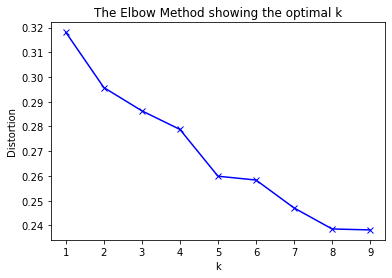

In [52]:
from sklearn import metrics
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt

# k means determine k
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(london_grouped_clustering)
    kmeanModel.fit(london_grouped_clustering)
    distortions.append(sum(np.min(cdist(london_grouped_clustering, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / london_grouped_clustering.shape[0])

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

### Create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [51]:
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

london_merged = data

london_merged = london_merged.join(neighborhoods_venues_sorted.set_index('Location'), on='Location')

london_merged

,Location,London_borough,Postcode district,Avg rent,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbey Wood,Bexley,SE2,1182.088333,51.492450,0.121270,3.0,Supermarket,Platform,Train Station,Convenience Store,Coffee Shop,Historic Site,Financial or Legal Service,Fabric Shop,Falafel Restaurant,Farmers Market
1,Crossness,Bexley,SE2,1182.088333,51.492450,0.121270,3.0,Supermarket,Platform,Train Station,Convenience Store,Coffee Shop,Historic Site,Financial or Legal Service,Fabric Shop,Falafel Restaurant,Farmers Market
2,West Heath,Bexley,SE2,1182.088333,51.492450,0.121270,3.0,Supermarket,Platform,Train Station,Convenience Store,Coffee Shop,Historic Site,Financial or Legal Service,Fabric Shop,Falafel Restaurant,Farmers Market
3,Acton,Ealing,W3,1439.957750,51.513240,-0.267460,5.0,Grocery Store,Indian Restaurant,Train Station,Breakfast Spot,Park,Film Studio,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant
4,Addington,Croydon,CR0,1125.042750,51.384755,-0.051498,2.0,Construction & Landscaping,Grocery Store,Zoo Exhibit,Fish & Chips Shop,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio
5,Addiscombe,Croydon,CR0,1125.042750,51.384755,-0.051498,2.0,Construction & Landscaping,Grocery Store,Zoo Exhibit,Fish & Chips Shop,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio
6,Coombe,Croydon,CR0,1125.042750,51.384755,-0.051498,3.0,Indian Restaurant,Food,Pub,Italian Restaurant,Construction & Landscaping,Hardware Store,Seafood Restaurant,Supermarket,Gastropub,Thai Restaurant
7,Croydon,Croydon,CR0,1125.042750,51.384755,-0.051498,2.0,Construction & Landscaping,Grocery Store,Zoo Exhibit,Fish & Chips Shop,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio
8,Forestdale,Croydon,CR0,1125.042750,51.384755,-0.051498,2.0,Construction & Landscaping,Grocery Store,Zoo Exhibit,Fish & Chips Shop,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio
9,New Addington,Croydon,CR0,1125.042750,51.384755,-0.051498,2.0,Construction & Landscaping,Grocery Store,Zoo Exhibit,Fish & Chips Shop,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio


### Droping the rows with null values

In [52]:
london_merged.dropna(inplace=True)

In [53]:
london_merged['Cluster Labels'] = london_merged['Cluster Labels'].astype(int)
london_merged['Avg rent'] = london_merged['Avg rent'].astype(int)
london_merged.dtypes

Location                   object
London_borough             object
Postcode district          object
Avg rent                    int32
Latitude                  float64
Longitude                 float64
Cluster Labels              int32
1st Most Common Venue      object
2nd Most Common Venue      object
3rd Most Common Venue      object
4th Most Common Venue      object
5th Most Common Venue      object
6th Most Common Venue      object
7th Most Common Venue      object
8th Most Common Venue      object
9th Most Common Venue      object
10th Most Common Venue     object
dtype: object

### There were many Locations that were assigned the same postcodes as they were very near so droping the duplicate postcodes

In [54]:
london_merged.drop_duplicates(subset='Postcode district',inplace=True)

In [55]:
london_merged.reset_index(inplace=True)
london_merged.drop(columns='index',inplace=True)

### Visualize the clusters

In [56]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(london_merged['Latitude'],london_merged['Longitude'], london_merged['Location'], london_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=3,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters


### Binning
There is the range of Avg price so binned the price into 6 distinct values
['Very Low', 'Low', 'Average', 'Above Average','High','Very High']

Text(0.5, 1.0, 'Price bins')

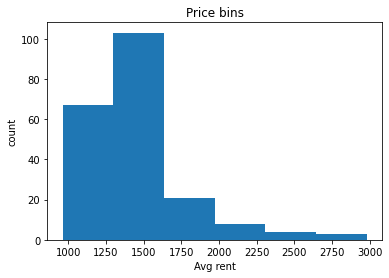

In [57]:
%matplotlib inline
import matplotlib as plt
from matplotlib import pyplot
plt.pyplot.hist(london_merged["Avg rent"],bins=6)

# set x/y labels and plot title
plt.pyplot.xlabel("Avg rent")
plt.pyplot.ylabel("count")
plt.pyplot.title("Price bins")

In [58]:
bins = np.linspace(min(london_merged["Avg rent"]), max(london_merged["Avg rent"]), 7)
bins

array([ 961.        , 1297.66666667, 1634.33333333, 1971.        ,
       2307.66666667, 2644.33333333, 2981.        ])

In [59]:
group_names = ['Very Low', 'Low', 'Average', 'Above Average','High','Very High']

In [60]:
london_merged['Price-Categories'] = pd.cut(london_merged['Avg rent'], bins, labels=group_names, include_lowest=True )
london_merged[['Avg rent','Price-Categories']].head()

,Avg rent,Price-Categories
0,1182,Very Low
1,1439,Low
2,1125,Very Low
3,1333,Low
4,1249,Very Low


### Cluster Bins
Creating 4 cluster bins

Text(0.5, 1.0, 'Cluster Labels')

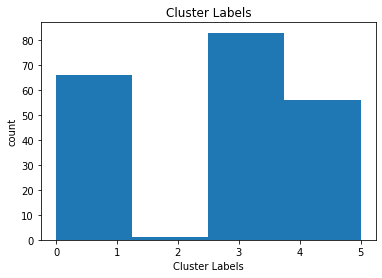

In [61]:
plt.pyplot.hist(london_merged["Cluster Labels"],bins=4)

# set x/y labels and plot title
plt.pyplot.xlabel("Cluster Labels")
plt.pyplot.ylabel("count")
plt.pyplot.title("Cluster Labels")

In [63]:
bins = np.linspace(min(london_merged["Cluster Labels"]), max(london_merged["Cluster Labels"]), 7)
bins

array([0.        , 0.83333333, 1.66666667, 2.5       , 3.33333333,
       4.16666667, 5.        ])

In [64]:
group_names = ['Hotels and Social Activities','Mixed Social Activities','Specific uses','Pubs and cafes', 'Sports and Parks','Restaurants and Bars']

In [65]:
london_merged['Cluster-Category'] = pd.cut(london_merged['Cluster Labels'], bins, labels=group_names, include_lowest=True )
london_merged[['Cluster Labels','Cluster-Category']].head()

,Cluster Labels,Cluster-Category
0,3,Pubs and cafes
1,5,Restaurants and Bars
2,2,Specific uses
3,0,Hotels and Social Activities
4,0,Hotels and Social Activities


## Final Merged Data

In [66]:
london_merged.drop(columns=['6th Most Common Venue','7th Most Common Venue','8th Most Common Venue','9th Most Common Venue','10th Most Common Venue'],inplace=True)
london_merged.head(20)

,Location,London_borough,Postcode district,Avg rent,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
0,Abbey Wood,Bexley,SE2,1182,51.492450,0.121270,3,Supermarket,Platform,Train Station,Convenience Store,Coffee Shop,Very Low,Pubs and cafes
1,Acton,Ealing,W3,1439,51.513240,-0.267460,5,Grocery Store,Indian Restaurant,Train Station,Breakfast Spot,Park,Low,Restaurants and Bars
2,Addington,Croydon,CR0,1125,51.384755,-0.051498,2,Construction & Landscaping,Grocery Store,Zoo Exhibit,Fish & Chips Shop,Fabric Shop,Very Low,Specific uses
3,Albany Park,Bexley,DA5,1333,51.506420,-0.127210,0,Hotel,Garden,Theater,Plaza,Monument / Landmark,Low,Hotels and Social Activities
4,Aldborough Hatch,Redbridge,IG2,1249,51.506420,-0.127210,0,Hotel,Garden,Theater,Plaza,Monument / Landmark,Very Low,Hotels and Social Activities
5,Aldwych,Westminster,WC2,2482,51.516510,-0.119680,3,Café,Pub,Sandwich Place,Theater,Hotel,High,Pubs and cafes
6,Alperton,Brent,HA0,1227,51.506420,-0.127210,0,Hotel,Garden,Theater,Plaza,Monument / Landmark,Very Low,Hotels and Social Activities
7,Anerley,Bromley,SE20,1143,51.410090,-0.056830,3,Supermarket,Grocery Store,Hotel,Fast Food Restaurant,Convenience Store,Very Low,Pubs and cafes
8,Angel,Islington,EC1,1919,51.523610,-0.098770,3,Coffee Shop,Food Truck,Pub,Park,Italian Restaurant,Average,Pubs and cafes
9,Aperfield,Bromley,TN16,1339,51.271793,0.074724,3,Gym / Fitness Center,Historic Site,Zoo Exhibit,Film Studio,Exhibit,Low,Pubs and cafes


## Creating Chloropleth map to visualize how London is divided in terms of Housing rents and cluster markers on the top

In [110]:
lnd_geo = r'london_boroughs_proper.geojson'
lnd_map = folium.Map(location = [latitude, longitude], zoom_start = 11)

lnd_map.choropleth(
    geo_data=lnd_geo,
    data=london_merged,
    columns=['London_borough','Avg rent'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Average house Rents'
)
# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(london_merged['Latitude'],london_merged['Longitude'], london_merged['Location'], london_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=3,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(lnd_map)
       
# display map
lnd_map

## Chloropleth map so to see how the London is clustered

In [68]:
lnd_geo = r'london_boroughs_proper.geojson'
lnd_map = folium.Map(location = [latitude, longitude], zoom_start = 10)

lnd_map.choropleth(
    geo_data=lnd_geo,
    data=london_merged,
    columns=['London_borough','Cluster Labels'],
    key_on='feature.properties.name',
    fill_color='PuRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Cluster Labels'
)

lnd_map

## Examining the Clusters

Cluster 1

In [69]:
london_merged[london_merged['Cluster Labels']==0]

,Location,London_borough,Postcode district,Avg rent,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
3,Albany Park,Bexley,DA5,1333,51.50642,-0.12721,0,Hotel,Garden,Theater,Plaza,Monument / Landmark,Low,Hotels and Social Activities
4,Aldborough Hatch,Redbridge,IG2,1249,51.50642,-0.12721,0,Hotel,Garden,Theater,Plaza,Monument / Landmark,Very Low,Hotels and Social Activities
6,Alperton,Brent,HA0,1227,51.50642,-0.12721,0,Hotel,Garden,Theater,Plaza,Monument / Landmark,Very Low,Hotels and Social Activities
11,Ardleigh Green,Havering,RM11,1208,51.58370,0.17476,0,Bus Station,Chinese Restaurant,Furniture / Home Store,Electronics Store,Fish & Chips Shop,Very Low,Hotels and Social Activities
31,Belgravia,Westminster,SW1,2577,51.49713,-0.13829,0,Hotel,Coffee Shop,Sandwich Place,Theater,Italian Restaurant,High,Hotels and Social Activities
33,Belmont,Harrow,HA3,1213,51.50642,-0.12721,0,Hotel,Garden,Theater,Plaza,Monument / Landmark,Very Low,Hotels and Social Activities
34,Belmont,Sutton,SM2,1190,51.50642,-0.12721,0,Hotel,Garden,Theater,Plaza,Monument / Landmark,Very Low,Hotels and Social Activities
37,Berrylands,Kingston upon Thames,KT5,1252,51.50642,-0.12721,0,Hotel,Garden,Theater,Plaza,Monument / Landmark,Very Low,Hotels and Social Activities
39,Bexleyheath (also Bexley New Town),Bexley,DA6,1133,51.50642,-0.12721,0,Hotel,Garden,Theater,Plaza,Monument / Landmark,Very Low,Hotels and Social Activities
50,Brent Park,Brent,NW10,1443,51.53938,-0.25205,0,Liquor Store,Fast Food Restaurant,Grocery Store,Chinese Restaurant,Pharmacy,Low,Hotels and Social Activities


In [73]:
london_merged[london_merged['Cluster Labels']==1]

,Location,London_borough,Postcode district,Avg rent,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
16,Barking,Barking and Dagenham,IG11,1261,51.53312,0.084077,1,Grocery Store,Park,Spa,Supermarket,Zoo Exhibit,Very Low,Mixed Social Activities
17,Barkingside,Redbridge,IG6,1444,51.50642,-0.127210,1,Hotel,Garden,Theater,Plaza,Monument / Landmark,Low,Mixed Social Activities
18,Barnehurst,Bexley,DA7,1265,51.47052,0.146705,1,Pub,Indian Restaurant,Forest,Convenience Store,Financial or Legal Service,Very Low,Mixed Social Activities
19,Barnes,Richmond upon Thames,SW13,2227,51.47469,-0.241630,1,Food & Drink Shop,Pub,Park,Café,Farmers Market,Above Average,Mixed Social Activities
52,Brixton,Lambeth,SW2,1513,51.45295,-0.120830,1,Coffee Shop,Pub,Indian Restaurant,Vegetarian / Vegan Restaurant,Bus Stop,Low,Mixed Social Activities
53,Brockley,Lewisham,SE4,1386,51.46268,-0.035580,1,Convenience Store,Grocery Store,Fish & Chips Shop,Gastropub,Beer Store,Low,Mixed Social Activities
61,Cann Hall,Waltham Forest,E11,1320,51.57676,0.027230,1,Café,Pub,Pharmacy,Bakery,Coffee Shop,Low,Mixed Social Activities
62,Canning Town,Newham,E16,1469,51.50913,0.015280,1,Café,Hotel,Middle Eastern Restaurant,Light Rail Station,Restaurant,Low,Mixed Social Activities
73,Church End,Barnet,N3,1483,51.60104,-0.194010,1,Supermarket,Turkish Restaurant,Pizza Place,Restaurant,Japanese Restaurant,Low,Mixed Social Activities
74,Clapham,Lambeth,SW4,1712,51.46095,-0.139220,1,Pub,Café,Burger Joint,Grocery Store,Gym / Fitness Center,Average,Mixed Social Activities


In [74]:
london_merged[london_merged['Cluster Labels']==2]

,Location,London_borough,Postcode district,Avg rent,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
2,Addington,Croydon,CR0,1125,51.384755,-0.051498,2,Construction & Landscaping,Grocery Store,Zoo Exhibit,Fish & Chips Shop,Fabric Shop,Very Low,Specific uses


In [75]:
london_merged[london_merged['Cluster Labels']==3]

,Location,London_borough,Postcode district,Avg rent,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
0,Abbey Wood,Bexley,SE2,1182,51.492450,0.121270,3,Supermarket,Platform,Train Station,Convenience Store,Coffee Shop,Very Low,Pubs and cafes
5,Aldwych,Westminster,WC2,2482,51.516510,-0.119680,3,Café,Pub,Sandwich Place,Theater,Hotel,High,Pubs and cafes
7,Anerley,Bromley,SE20,1143,51.410090,-0.056830,3,Supermarket,Grocery Store,Hotel,Fast Food Restaurant,Convenience Store,Very Low,Pubs and cafes
8,Angel,Islington,EC1,1919,51.523610,-0.098770,3,Coffee Shop,Food Truck,Pub,Park,Italian Restaurant,Average,Pubs and cafes
9,Aperfield,Bromley,TN16,1339,51.271793,0.074724,3,Gym / Fitness Center,Historic Site,Zoo Exhibit,Film Studio,Exhibit,Low,Pubs and cafes
10,Archway,Islington,N19,1520,51.563930,-0.129450,3,Grocery Store,Coffee Shop,Pizza Place,Pub,Italian Restaurant,Low,Pubs and cafes
12,Arkley,Barnet,EN5,1256,51.644415,-0.179183,3,Recruiting Agency,Pub,Coffee Shop,Tennis Court,Zoo Exhibit,Very Low,Pubs and cafes
14,Balham,Wandsworth,SW12,1641,51.448220,-0.148390,3,Coffee Shop,Grocery Store,Pub,Indian Restaurant,Bakery,Average,Pubs and cafes
15,Bankside,Southwark,SE1,1862,51.499960,-0.095680,3,Pub,Coffee Shop,Café,Hotel,Park,Average,Pubs and cafes
20,Barnes Cray,Bexley,DA1,1147,51.452020,0.172281,3,Pub,Track Stadium,Italian Restaurant,Mediterranean Restaurant,Supermarket,Very Low,Pubs and cafes


Examining Property prices

In [76]:
london_merged[london_merged['Price-Categories']=='Very High']

,Location,London_borough,Postcode district,Avg rent,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
69,Chinatown,Westminster,W1,2665,51.51656,-0.14770,0,Coffee Shop,Hotel,Clothing Store,Juice Bar,French Restaurant,Very High,Hotels and Social Activities
138,Holland Park,Kensington and Chelsea,W8,2921,51.50162,-0.19173,0,Hotel,Juice Bar,Pub,Restaurant,Art Gallery,Very High,Hotels and Social Activities
146,Kensington,Kensington and Chelsea,SW7,2981,51.49807,-0.17404,0,Exhibit,Café,Science Museum,Hotel,Garden,Very High,Hotels and Social Activities


In [77]:
london_merged[london_merged['Price-Categories']=='High']

,Location,London_borough,Postcode district,Avg rent,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
5,Aldwych,Westminster,WC2,2482,51.51651,-0.11968,3,Café,Pub,Sandwich Place,Theater,Hotel,High,Pubs and cafes
31,Belgravia,Westminster,SW1,2577,51.49713,-0.13829,0,Hotel,Coffee Shop,Sandwich Place,Theater,Italian Restaurant,High,Hotels and Social Activities
55,Brompton,Kensington and Chelsea,SW3,2592,51.49014,-0.16248,3,Hotel,Pub,Café,Japanese Restaurant,English Restaurant,High,Pubs and cafes
151,Lisson Grove,Westminster,NW8,2572,51.53398,-0.17378,4,Cricket Ground,Deli / Bodega,Coffee Shop,Café,Fast Food Restaurant,High,Sports and Parks


In [78]:
london_merged[london_merged['Price-Categories']=='Average']

,Location,London_borough,Postcode district,Avg rent,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
8,Angel,Islington,EC1,1919,51.52361,-0.098770,3,Coffee Shop,Food Truck,Pub,Park,Italian Restaurant,Average,Pubs and cafes
14,Balham,Wandsworth,SW12,1641,51.44822,-0.148390,3,Coffee Shop,Grocery Store,Pub,Indian Restaurant,Bakery,Average,Pubs and cafes
15,Bankside,Southwark,SE1,1862,51.49996,-0.095680,3,Pub,Coffee Shop,Café,Hotel,Park,Average,Pubs and cafes
22,Barnsbury,Islington,N1,1800,51.52969,-0.086970,3,Coffee Shop,Pub,Cocktail Bar,Breakfast Spot,Burger Joint,Average,Pubs and cafes
41,Blackfriars,City,EC4,1732,51.51389,-0.104340,3,Italian Restaurant,Coffee Shop,Pub,Sandwich Place,Wine Bar,Average,Pubs and cafes
44,Bloomsbury,Camden,WC1,1789,51.52450,-0.122730,4,Pub,Bookstore,Café,Garden,Coffee Shop,Average,Sports and Parks
60,Camden Town,Camden,NW1,1954,51.53354,-0.146060,4,Zoo Exhibit,Coffee Shop,Pub,Japanese Restaurant,Music Venue,Average,Sports and Parks
74,Clapham,Lambeth,SW4,1712,51.46095,-0.139220,1,Pub,Café,Burger Joint,Grocery Store,Gym / Fitness Center,Average,Mixed Social Activities
87,Dalston,Hackney,E8,1659,51.54505,-0.055320,3,Pub,Coffee Shop,Brewery,Café,Cocktail Bar,Average,Pubs and cafes
92,Earls Court,Kensington and Chelsea,SW5,1851,51.49004,-0.189710,0,Hotel,Garden,Café,Indian Restaurant,Cocktail Bar,Average,Hotels and Social Activities


In [116]:
london_merged[london_merged['Price-Categories']=='Above Average']

,Location,London_borough,Postcode district,Avg rent,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
19,Barnes,Richmond upon Thames,SW13,2128,51.47469,-0.24163,0,Farmers Market,Pub,Park,Café,Food & Drink Shop,Above Average,Mixed Social Venues
23,Battersea,Wandsworth,SW11,2141,51.46760,-0.16290,3,Café,Indian Restaurant,Supermarket,Pub,Bar,Above Average,Pubs and Historic places
24,Bayswater,Westminster,W2,2314,51.51494,-0.18048,0,Hotel,Coffee Shop,Café,Pub,Italian Restaurant,Above Average,Mixed Social Venues
35,Belsize Park,Camden,NW3,2312,51.55506,-0.17348,3,Café,Pub,Bakery,Italian Restaurant,Museum,Above Average,Pubs and Historic places
111,Fulham,Hammersmith and Fulham,SW6,2011,51.47772,-0.20145,3,Coffee Shop,Café,Pub,French Restaurant,Italian Restaurant,Above Average,Pubs and Historic places
124,Hammersmith,Hammersmith and Fulham,W6,2156,51.49617,-0.22935,3,Pub,Sandwich Place,Gym / Fitness Center,Hotel,Coffee Shop,Above Average,Pubs and Historic places
167,Notting Hill,Kensington and Chelsea,W11,2181,51.51244,-0.20639,3,Italian Restaurant,Pub,Bakery,Café,Bookstore,Above Average,Pubs and Historic places
199,West Brompton,Kensington and Chelsea,SW10,2293,51.48563,-0.18144,3,Italian Restaurant,Cocktail Bar,Gourmet Shop,Grocery Store,Juice Bar,Above Average,Pubs and Historic places


In [79]:
london_merged[london_merged['Price-Categories']=='Low']

,Location,London_borough,Postcode district,Avg rent,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
1,Acton,Ealing,W3,1439,51.513240,-0.267460,5,Grocery Store,Indian Restaurant,Train Station,Breakfast Spot,Park,Low,Restaurants and Bars
3,Albany Park,Bexley,DA5,1333,51.506420,-0.127210,0,Hotel,Garden,Theater,Plaza,Monument / Landmark,Low,Hotels and Social Activities
9,Aperfield,Bromley,TN16,1339,51.271793,0.074724,3,Gym / Fitness Center,Historic Site,Zoo Exhibit,Film Studio,Exhibit,Low,Pubs and cafes
10,Archway,Islington,N19,1520,51.563930,-0.129450,3,Grocery Store,Coffee Shop,Pizza Place,Pub,Italian Restaurant,Low,Pubs and cafes
13,Arnos Grove,Enfield,N11,1354,51.616310,-0.138390,5,Grocery Store,Fish & Chips Shop,Train Station,Beer Bar,Metro Station,Low,Restaurants and Bars
17,Barkingside,Redbridge,IG6,1444,51.506420,-0.127210,1,Hotel,Garden,Theater,Plaza,Monument / Landmark,Low,Mixed Social Activities
21,Barnet Gate,Barnet,NW7,1474,51.615680,-0.245110,3,Juice Bar,Salon / Barbershop,Platform,Chinese Restaurant,Grocery Store,Low,Pubs and cafes
26,Beckton,Newham,E6,1482,51.532920,0.054610,4,Fast Food Restaurant,Sandwich Place,Optical Shop,Clothing Store,Park,Low,Sports and Parks
27,Becontree,Barking and Dagenham,RM9,1385,51.506420,-0.127210,4,Hotel,Garden,Theater,Plaza,Monument / Landmark,Low,Sports and Parks
28,Becontree Heath,Barking and Dagenham,RM8,1313,51.506420,-0.127210,4,Hotel,Garden,Theater,Plaza,Monument / Landmark,Low,Sports and Parks


In [80]:
london_merged[london_merged['Price-Categories']=='Very Low']

,Location,London_borough,Postcode district,Avg rent,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
0,Abbey Wood,Bexley,SE2,1182,51.492450,0.121270,3,Supermarket,Platform,Train Station,Convenience Store,Coffee Shop,Very Low,Pubs and cafes
2,Addington,Croydon,CR0,1125,51.384755,-0.051498,2,Construction & Landscaping,Grocery Store,Zoo Exhibit,Fish & Chips Shop,Fabric Shop,Very Low,Specific uses
4,Aldborough Hatch,Redbridge,IG2,1249,51.506420,-0.127210,0,Hotel,Garden,Theater,Plaza,Monument / Landmark,Very Low,Hotels and Social Activities
6,Alperton,Brent,HA0,1227,51.506420,-0.127210,0,Hotel,Garden,Theater,Plaza,Monument / Landmark,Very Low,Hotels and Social Activities
7,Anerley,Bromley,SE20,1143,51.410090,-0.056830,3,Supermarket,Grocery Store,Hotel,Fast Food Restaurant,Convenience Store,Very Low,Pubs and cafes
11,Ardleigh Green,Havering,RM11,1208,51.583700,0.174760,0,Bus Station,Chinese Restaurant,Furniture / Home Store,Electronics Store,Fish & Chips Shop,Very Low,Hotels and Social Activities
12,Arkley,Barnet,EN5,1256,51.644415,-0.179183,3,Recruiting Agency,Pub,Coffee Shop,Tennis Court,Zoo Exhibit,Very Low,Pubs and cafes
16,Barking,Barking and Dagenham,IG11,1261,51.533120,0.084077,1,Grocery Store,Park,Spa,Supermarket,Zoo Exhibit,Very Low,Mixed Social Activities
18,Barnehurst,Bexley,DA7,1265,51.470520,0.146705,1,Pub,Indian Restaurant,Forest,Convenience Store,Financial or Legal Service,Very Low,Mixed Social Activities
20,Barnes Cray,Bexley,DA1,1147,51.452020,0.172281,3,Pub,Track Stadium,Italian Restaurant,Mediterranean Restaurant,Supermarket,Very Low,Pubs and cafes


## Result

I came to the result that the house rental prices in the downtown  with Hotels and Social venues nearby are very high, while in the suburbs and the neighborhoods away from the city center have low prices but the facilities are also good. Almost all low rent price neighborhoods are close to restaurants, pubs. Some Boroughs such as Westminster, and Kensington and Chelsea have very high house rental prices. Bexley, Croydon, and Sutton Boroughs have very low rental prices but have good venues to visit nearby.

## Conclusion

As people are turning to big cities to start a business or work. For this reason, people can easily interpret where to live with all facilities and cheaply.

Not only for investors but also city managers can manage the city more regularly by using similar data analysis types or platforms.